In [9]:
pip install opencv-python opencv-python-headless

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [52]:
import subprocess

# Step 1: Uninstall and reinstall NumPy
subprocess.run(["pip", "uninstall", "numpy", "-y"], check=True)
subprocess.run(["pip", "install", "numpy"], check=True)

# Step 2: Upgrade OpenCV and related libraries
subprocess.run(["pip", "install", "--upgrade", "opencv-python", "opencv-python-headless"], check=True)

# Step 3: Clear pip cache
subprocess.run(["pip", "cache", "purge"], check=True)

# Step 4: Verify the installations
import numpy as np
import cv2
print("NumPy version:", np.__version__)
print("OpenCV version:", cv2.__version__)


NumPy version: 2.1.3
OpenCV version: 4.10.0


In [1]:
import cv2
import numpy as np
import os

In [6]:
!pip install "numpy<2"


[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [7]:
!pip install -U matplotlib

   ---------------------------------------- 0.0/7.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/7.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/7.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/7.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/7.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/7.8 MB ? eta -:--:--
   ---------------------------------------- 0.1/7.8 MB 252.2 kB/s eta 0:00:31
   ---------------------------------------- 0.1/7.8 MB 252.2 kB/s eta 0:00:31
    --------------------------------------- 0.1/7.8 MB 328.2 kB/s eta 0:00:24
    --------------------------------------- 0.1/7.8 MB 328.2 kB/s eta 0:00:24
   - -------------------------------------- 0.2/7.8 MB 479.2 kB/s eta 0:00:16
   - -------------------------------------- 0.2/7.8 MB 479.2 kB/s eta 0:00:16
   - -------------------------------------- 0.2/7.8 MB 479.2 kB/s eta 0:00:16
   - -----------------------------------

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ydata-profiling 4.8.3 requires matplotlib<3.9,>=3.2, but you have matplotlib 3.9.2 which is incompatible.
ydata-profiling 4.8.3 requires scipy<1.14,>=1.4.1, but you have scipy 1.14.1 which is incompatible.

[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
import matplotlib.pyplot as plt

In [3]:
# Function to detect motion in the video frame
def detect_motion(frame, bg_frame, threshold=30):
    # Convert frames to grayscale
    gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    gray_bg_frame = cv2.cvtColor(bg_frame, cv2.COLOR_BGR2GRAY)

    # Get the difference between the background frame and the current frame
    diff = cv2.absdiff(gray_bg_frame, gray_frame)
    
    # Apply threshold to detect significant changes
    _, thresh = cv2.threshold(diff, threshold, 255, cv2.THRESH_BINARY)
    
    # Use dilation to fill in gaps
    dilated = cv2.dilate(thresh, None, iterations=2)
    
    # Find contours of the motion areas
    contours, _ = cv2.findContours(dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Return the contours to draw bounding boxes
    return contours

In [4]:
# Function to compress video using FFmpeg
def compress_video(input_file, output_file, crf=28):
    # Command to compress video using FFmpeg
    ffmpeg_command = f"ffmpeg -i {input_file} -vcodec libx264 -crf {crf} {output_file}"
    os.system(ffmpeg_command)

In [5]:
# Function to display frame using Matplotlib (for Jupyter)
def display_frame(frame):
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    plt.imshow(frame_rgb)
    plt.axis('off')  # Hide the axis
    plt.show()

In [6]:
# Path to the video file (set your dataset video path here)
video_file_path = "C:\\Users\\salon\\Documents\\sem7\\BTP\\motion_detection_video_samples\\datav1btp.mov"
cap = cv2.VideoCapture(video_file_path)

In [7]:
# Check if the video file opened successfully
if not cap.isOpened():
    print(f"Error: Cannot open video file {video_file_path}")
    exit()

In [8]:
# Read the first frame as the background for motion detection
ret, bg_frame = cap.read()

In [9]:
# Video writer for saving motion-triggered recordings
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = None
is_recording = False
output_file = 'motion_detected.avi'

Motion detected! Starting recording...


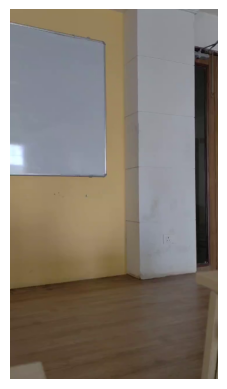

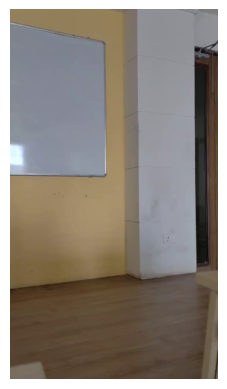

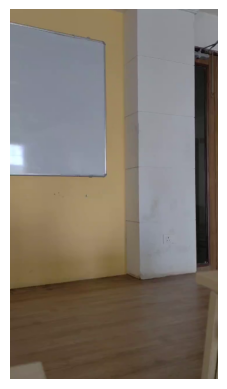

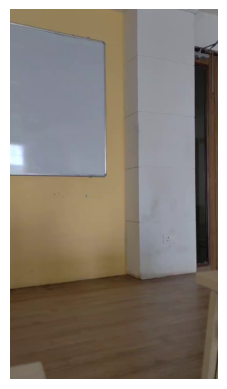

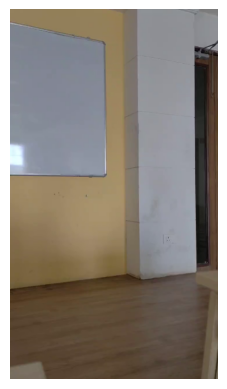

...

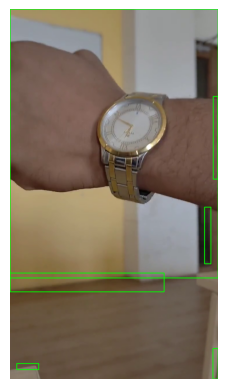

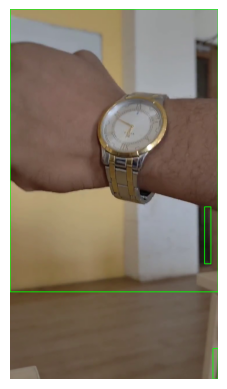

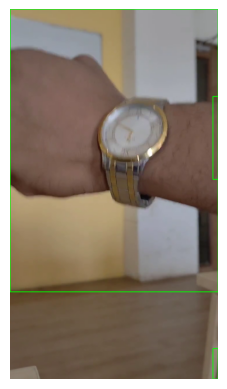

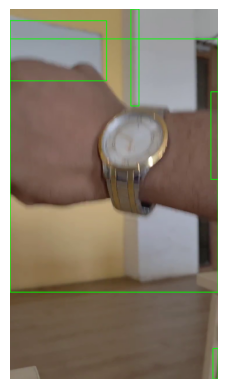

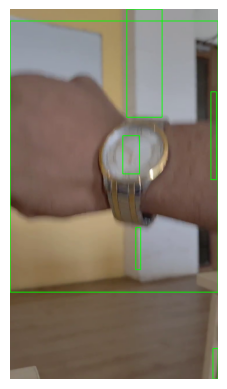

In [10]:
# Main loop to process video frames
while cap.isOpened():
    ret, frame = cap.read()
    
    if not ret:
        break

    # Detect motion and get the contours of moving objects
    contours = detect_motion(frame, bg_frame)
    
    if len(contours) > 0:
        if not is_recording:
            # Start recording when motion is detected
            print("Motion detected! Starting recording...")
            is_recording = True
            out = cv2.VideoWriter(output_file, fourcc, 20.0, (frame.shape[1], frame.shape[0]))
        
        # Draw bounding boxes around detected motion
        for contour in contours:
            if cv2.contourArea(contour) > 500:  # Ignore small contours
                (x, y, w, h) = cv2.boundingRect(contour)
                cv2.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 2)

        # Write the frame to the video file
        out.write(frame)
        
        # Display the frame with bounding boxes
        display_frame(frame)  # Use this for Jupyter
    else:
        if is_recording:
            # Stop recording if no motion is detected
            print("No motion. Stopping recording.")
            is_recording = False
            out.release()
            compress_video(output_file, 'compressed_output.mp4')  # Compress the video
            break  # For demo purposes, stop after the first detected motion